<a href="https://colab.research.google.com/github/singhjyoti1997/Deep-Learning/blob/main/cityscapeimgae_usingGAN.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
!pip install opendatasets

In [2]:
import opendatasets as od

dataset_url = 'https://www.kaggle.com/datasets/shuvoalok/cityscapes'
od.download(dataset_url)

Please provide your Kaggle credentials to download this dataset. Learn more: http://bit.ly/kaggle-creds
Your Kaggle username: jyoti19971111
Your Kaggle Key: ··········


100%|██████████| 199M/199M [00:02<00:00, 94.9MB/s]


In [3]:
import os

DATA_DIR = '/content/cityscapes_'
print(os.listdir(DATA_DIR))

['img']


In [4]:
print(os.listdir(DATA_DIR+'/img')[:10])

['train1363.png', 'train555.png', 'train1751.png', 'train2336.png', 'train899.png', 'train1018.png', 'train2137.png', 'train1607.png', 'train612.png', 'train2318.png']


In [5]:
from torch.utils.data import DataLoader
from torchvision.datasets import ImageFolder
import torchvision.transforms as T

In [6]:
image_size = 64
batch_size = 128
stats = (0.5, 0.5, 0.5), (0.5, 0.5, 0.5)

In [7]:
train_ds = ImageFolder(DATA_DIR, transform=T.Compose([
    T.Resize(image_size),
    T.CenterCrop(image_size),
    T.ToTensor(),
    T.Normalize(*stats)]))

train_dl = DataLoader(train_ds, batch_size, shuffle=True, num_workers=3, pin_memory=True)

/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py:558: UserWarning: This DataLoader will create 3 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(_create_warning_msg(


In [8]:
import torch
from torchvision.utils import make_grid
import matplotlib.pyplot as plt
%matplotlib inline

In [9]:
def denorm(img_tensors):
    return img_tensors * stats[1][0] + stats[0][0]

In [10]:
def show_images(images, nmax=64):
    fig, ax = plt.subplots(figsize=(8, 8))
    ax.set_xticks([]); ax.set_yticks([])
    ax.imshow(make_grid(denorm(images.detach()[:nmax]), nrow=8).permute(1, 2, 0))

def show_batch(dl, nmax=64):
    for images, _ in dl:
        show_images(images, nmax)
        break

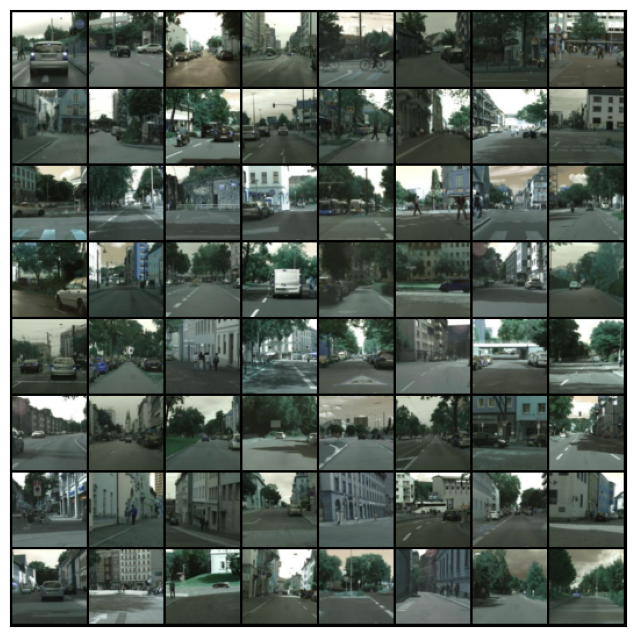

In [11]:
show_batch(train_dl)

In [12]:
def get_default_device():
    """Pick GPU if available, else CPU"""
    if torch.cuda.is_available():
        return torch.device('cuda')
    else:
        return torch.device('cpu')

def to_device(data, device):
    """Move tensor(s) to chosen device"""
    if isinstance(data, (list,tuple)):
        return [to_device(x, device) for x in data]
    return data.to(device, non_blocking=True)

class DeviceDataLoader():
    """Wrap a dataloader to move data to a device"""
    def __init__(self, dl, device):
        self.dl = dl
        self.device = device

    def __iter__(self):
        """Yield a batch of data after moving it to device"""
        for b in self.dl:
            yield to_device(b, self.device)

    def __len__(self):
        """Number of batches"""
        return len(self.dl)

In [13]:
device = get_default_device()
device

device(type='cuda')

In [14]:
train_dl = DeviceDataLoader(train_dl, device)

In [15]:
import torch.nn as nn

In [16]:
discriminator = nn.Sequential(
    # in: 3 x 64 x 64

    nn.Conv2d(3, 64, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(64),
    nn.LeakyReLU(0.2, inplace=True),
    # out: 64 x 32 x 32

    nn.Conv2d(64, 128, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(128),
    nn.LeakyReLU(0.2, inplace=True),
    # out: 128 x 16 x 16

    nn.Conv2d(128, 256, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(256),
    nn.LeakyReLU(0.2, inplace=True),
    # out: 256 x 8 x 8

    nn.Conv2d(256, 512, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(512),
    nn.LeakyReLU(0.2, inplace=True),
    # out: 512 x 4 x 4

    nn.Conv2d(512, 1, kernel_size=4, stride=1, padding=0, bias=False),
    # out: 1 x 1 x 1

    nn.Flatten(),
    nn.Sigmoid())

In [17]:
discriminator = to_device(discriminator, device)

In [18]:
latent_size = 128

In [19]:
generator = nn.Sequential(
    # in: latent_size x 1 x 1

    nn.ConvTranspose2d(latent_size, 512, kernel_size=4, stride=1, padding=0, bias=False),
    nn.BatchNorm2d(512),
    nn.ReLU(True),
    # out: 512 x 4 x 4

    nn.ConvTranspose2d(512, 256, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(256),
    nn.ReLU(True),
    # out: 256 x 8 x 8

    nn.ConvTranspose2d(256, 128, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(128),
    nn.ReLU(True),
    # out: 128 x 16 x 16

    nn.ConvTranspose2d(128, 64, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(64),
    nn.ReLU(True),
    # out: 64 x 32 x 32

    nn.ConvTranspose2d(64, 3, kernel_size=4, stride=2, padding=1, bias=False),
    nn.Tanh()
    # out: 3 x 64 x 64
)

torch.Size([128, 3, 64, 64])


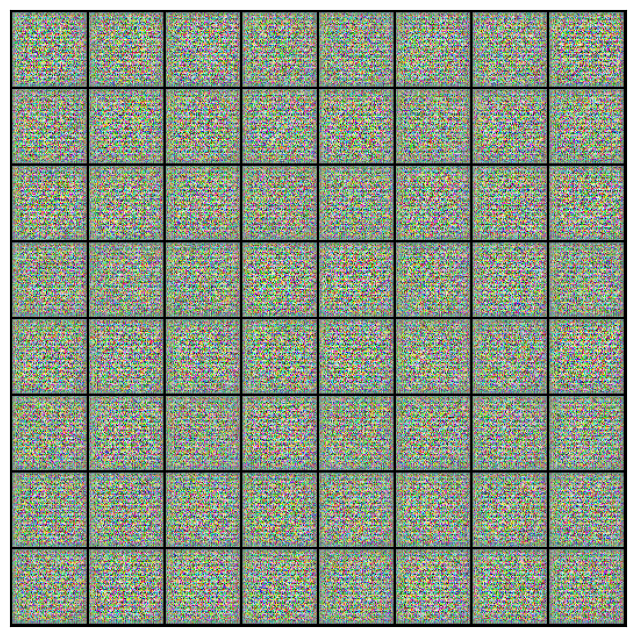

In [20]:
xb = torch.randn(batch_size, latent_size, 1, 1) # random latent tensors
fake_images = generator(xb)
print(fake_images.shape)
show_images(fake_images)

In [21]:
generator = to_device(generator, device)

In [22]:
def train_discriminator(real_images, opt_d):
    # Clear discriminator gradients
    opt_d.zero_grad()

    # Pass real images through discriminator
    real_preds = discriminator(real_images)
    real_targets = torch.ones(real_images.size(0), 1, device=device)
    real_loss = F.binary_cross_entropy(real_preds, real_targets)
    real_score = torch.mean(real_preds).item()

    # Generate fake images
    latent = torch.randn(batch_size, latent_size, 1, 1, device=device)
    fake_images = generator(latent)

    # Pass fake images through discriminator
    fake_targets = torch.zeros(fake_images.size(0), 1, device=device)
    fake_preds = discriminator(fake_images)
    fake_loss = F.binary_cross_entropy(fake_preds, fake_targets)
    fake_score = torch.mean(fake_preds).item()

    # Update discriminator weights
    loss = real_loss + fake_loss
    loss.backward()
    opt_d.step()
    return loss.item(), real_score, fake_score

In [23]:
def train_generator(opt_g):
    # Clear generator gradients
    opt_g.zero_grad()

    # Generate fake images
    latent = torch.randn(batch_size, latent_size, 1, 1, device=device)
    fake_images = generator(latent)

    # Try to fool the discriminator
    preds = discriminator(fake_images)
    targets = torch.ones(batch_size, 1, device=device)
    loss = F.binary_cross_entropy(preds, targets)

    # Update generator weights
    loss.backward()
    opt_g.step()

    return loss.item()

In [24]:
from torchvision.utils import save_image

In [25]:
sample_dir = 'generated'
os.makedirs(sample_dir, exist_ok=True)

In [26]:
def save_samples(index, latent_tensors, show=True):
    fake_images = generator(latent_tensors)
    fake_fname = 'generated-images-{0:0=4d}.png'.format(index)
    save_image(denorm(fake_images), os.path.join(sample_dir, fake_fname), nrow=8)
    print('Saving', fake_fname)
    if show:
        fig, ax = plt.subplots(figsize=(8, 8))
        ax.set_xticks([]); ax.set_yticks([])
        ax.imshow(make_grid(fake_images.cpu().detach(), nrow=8).permute(1, 2, 0))

In [27]:
fixed_latent = torch.randn(64, latent_size, 1, 1, device=device)

Saving generated-images-0000.png


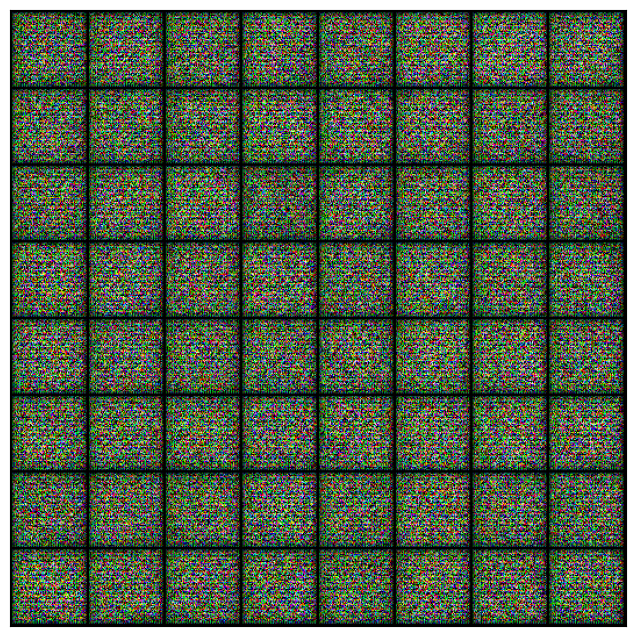

In [28]:
save_samples(0, fixed_latent)

In [29]:
from tqdm.notebook import tqdm
import torch.nn.functional as F

In [30]:
def fit(epochs, lr, start_idx=1):
    torch.cuda.empty_cache()

    # Losses & scores
    losses_g = []
    losses_d = []
    real_scores = []
    fake_scores = []

    # Create optimizers
    opt_d = torch.optim.Adam(discriminator.parameters(), lr=lr, betas=(0.5, 0.999))
    opt_g = torch.optim.Adam(generator.parameters(), lr=lr, betas=(0.5, 0.999))

    for epoch in range(epochs):
        for real_images, _ in tqdm(train_dl):
            # Train discriminator
            loss_d, real_score, fake_score = train_discriminator(real_images, opt_d)
            # Train generator
            loss_g = train_generator(opt_g)

        # Record losses & scores
        losses_g.append(loss_g)
        losses_d.append(loss_d)
        real_scores.append(real_score)
        fake_scores.append(fake_score)

        # Log losses & scores (last batch)
        print("Epoch [{}/{}], loss_g: {:.4f}, loss_d: {:.4f}, real_score: {:.4f}, fake_score: {:.4f}".format(
            epoch+1, epochs, loss_g, loss_d, real_score, fake_score))

        # Save generated images
        save_samples(epoch+start_idx, fixed_latent, show=False)

    return losses_g, losses_d, real_scores, fake_scores

In [31]:
lr = 0.0002
epochs = 500

In [32]:
history = fit(epochs, lr)

  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [1/500], loss_g: 7.5942, loss_d: 0.0173, real_score: 0.9852, fake_score: 0.0023
Saving generated-images-0001.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [2/500], loss_g: 18.0263, loss_d: 0.9349, real_score: 0.5525, fake_score: 0.0000
Saving generated-images-0002.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [3/500], loss_g: 12.2602, loss_d: 0.4784, real_score: 0.7168, fake_score: 0.0000
Saving generated-images-0003.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [4/500], loss_g: 2.6967, loss_d: 0.9316, real_score: 0.5696, fake_score: 0.1596
Saving generated-images-0004.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [5/500], loss_g: 2.4850, loss_d: 0.1838, real_score: 0.9719, fake_score: 0.1370
Saving generated-images-0005.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [6/500], loss_g: 3.1337, loss_d: 0.5123, real_score: 0.8274, fake_score: 0.2411
Saving generated-images-0006.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [7/500], loss_g: 2.5950, loss_d: 0.8803, real_score: 0.4774, fake_score: 0.0554
Saving generated-images-0007.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [8/500], loss_g: 1.8415, loss_d: 0.6919, real_score: 0.8096, fake_score: 0.3457
Saving generated-images-0008.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [9/500], loss_g: 3.9166, loss_d: 0.6921, real_score: 0.7539, fake_score: 0.3110
Saving generated-images-0009.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [10/500], loss_g: 6.2328, loss_d: 1.4936, real_score: 0.9106, fake_score: 0.7126
Saving generated-images-0010.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [11/500], loss_g: 3.6369, loss_d: 0.5118, real_score: 0.8840, fake_score: 0.3052
Saving generated-images-0011.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [12/500], loss_g: 1.9458, loss_d: 1.7864, real_score: 0.2219, fake_score: 0.0272
Saving generated-images-0012.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [13/500], loss_g: 7.0866, loss_d: 1.7318, real_score: 0.9877, fake_score: 0.7834
Saving generated-images-0013.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [14/500], loss_g: 3.1575, loss_d: 0.4233, real_score: 0.7786, fake_score: 0.1270
Saving generated-images-0014.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [15/500], loss_g: 3.5306, loss_d: 0.4583, real_score: 0.8122, fake_score: 0.1904
Saving generated-images-0015.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [16/500], loss_g: 3.9596, loss_d: 0.3605, real_score: 0.8622, fake_score: 0.1766
Saving generated-images-0016.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [17/500], loss_g: 5.0792, loss_d: 0.3747, real_score: 0.8792, fake_score: 0.2048
Saving generated-images-0017.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [18/500], loss_g: 4.2812, loss_d: 0.5026, real_score: 0.9454, fake_score: 0.3198
Saving generated-images-0018.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [19/500], loss_g: 4.5155, loss_d: 0.2292, real_score: 0.9363, fake_score: 0.1465
Saving generated-images-0019.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [20/500], loss_g: 4.4028, loss_d: 1.7644, real_score: 0.2006, fake_score: 0.0022
Saving generated-images-0020.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [21/500], loss_g: 3.1383, loss_d: 0.4343, real_score: 0.6966, fake_score: 0.0423
Saving generated-images-0021.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [22/500], loss_g: 4.4984, loss_d: 0.6863, real_score: 0.9162, fake_score: 0.4264
Saving generated-images-0022.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [23/500], loss_g: 2.4054, loss_d: 0.1515, real_score: 0.9101, fake_score: 0.0512
Saving generated-images-0023.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [24/500], loss_g: 2.9577, loss_d: 0.3706, real_score: 0.7617, fake_score: 0.0584
Saving generated-images-0024.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [25/500], loss_g: 2.8720, loss_d: 0.3078, real_score: 0.9406, fake_score: 0.1846
Saving generated-images-0025.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [26/500], loss_g: 1.3287, loss_d: 0.7682, real_score: 0.5405, fake_score: 0.0490
Saving generated-images-0026.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [27/500], loss_g: 4.5636, loss_d: 0.3598, real_score: 0.9283, fake_score: 0.2385
Saving generated-images-0027.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [28/500], loss_g: 0.9297, loss_d: 1.0903, real_score: 0.3965, fake_score: 0.0345
Saving generated-images-0028.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [29/500], loss_g: 3.9095, loss_d: 0.4500, real_score: 0.7691, fake_score: 0.1436
Saving generated-images-0029.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [30/500], loss_g: 4.8297, loss_d: 1.7799, real_score: 0.9919, fake_score: 0.7839
Saving generated-images-0030.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [31/500], loss_g: 5.0269, loss_d: 0.5755, real_score: 0.8505, fake_score: 0.2946
Saving generated-images-0031.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [32/500], loss_g: 1.4911, loss_d: 1.0653, real_score: 0.3970, fake_score: 0.0082
Saving generated-images-0032.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [33/500], loss_g: 4.0999, loss_d: 0.8760, real_score: 0.9883, fake_score: 0.5251
Saving generated-images-0033.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [34/500], loss_g: 3.1301, loss_d: 0.3729, real_score: 0.8819, fake_score: 0.1974
Saving generated-images-0034.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [35/500], loss_g: 5.3397, loss_d: 0.6746, real_score: 0.9742, fake_score: 0.4439
Saving generated-images-0035.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [36/500], loss_g: 3.9075, loss_d: 0.3295, real_score: 0.9442, fake_score: 0.2247
Saving generated-images-0036.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [37/500], loss_g: 3.4140, loss_d: 0.4456, real_score: 0.7215, fake_score: 0.0638
Saving generated-images-0037.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [38/500], loss_g: 7.8870, loss_d: 1.0144, real_score: 0.9927, fake_score: 0.5750
Saving generated-images-0038.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [39/500], loss_g: 5.6816, loss_d: 4.7710, real_score: 0.0200, fake_score: 0.0002
Saving generated-images-0039.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [40/500], loss_g: 3.2361, loss_d: 0.4087, real_score: 0.8142, fake_score: 0.1613
Saving generated-images-0040.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [41/500], loss_g: 3.6294, loss_d: 0.3668, real_score: 0.9458, fake_score: 0.2514
Saving generated-images-0041.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [42/500], loss_g: 2.6342, loss_d: 0.5549, real_score: 0.6648, fake_score: 0.0799
Saving generated-images-0042.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [43/500], loss_g: 3.3000, loss_d: 0.5165, real_score: 0.8251, fake_score: 0.2519
Saving generated-images-0043.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [44/500], loss_g: 4.8690, loss_d: 1.5904, real_score: 0.2780, fake_score: 0.0028
Saving generated-images-0044.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [45/500], loss_g: 2.2096, loss_d: 0.2518, real_score: 0.9125, fake_score: 0.1365
Saving generated-images-0045.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [46/500], loss_g: 2.3830, loss_d: 0.3547, real_score: 0.8060, fake_score: 0.0992
Saving generated-images-0046.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [47/500], loss_g: 2.4379, loss_d: 0.4580, real_score: 0.8956, fake_score: 0.2688
Saving generated-images-0047.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [48/500], loss_g: 2.7899, loss_d: 0.4556, real_score: 0.7482, fake_score: 0.1155
Saving generated-images-0048.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [49/500], loss_g: 3.4346, loss_d: 0.5271, real_score: 0.8200, fake_score: 0.2452
Saving generated-images-0049.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [50/500], loss_g: 2.8006, loss_d: 0.4257, real_score: 0.7641, fake_score: 0.1183
Saving generated-images-0050.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [51/500], loss_g: 4.2449, loss_d: 0.2263, real_score: 0.8799, fake_score: 0.0837
Saving generated-images-0051.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [52/500], loss_g: 5.1977, loss_d: 0.8718, real_score: 0.9032, fake_score: 0.5037
Saving generated-images-0052.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [53/500], loss_g: 4.5427, loss_d: 2.0204, real_score: 0.2307, fake_score: 0.0018
Saving generated-images-0053.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [54/500], loss_g: 4.6632, loss_d: 0.3101, real_score: 0.7744, fake_score: 0.0186
Saving generated-images-0054.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [55/500], loss_g: 5.4177, loss_d: 0.5437, real_score: 0.9530, fake_score: 0.3580
Saving generated-images-0055.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [56/500], loss_g: 3.9567, loss_d: 0.3644, real_score: 0.8661, fake_score: 0.1813
Saving generated-images-0056.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [57/500], loss_g: 3.2118, loss_d: 0.4237, real_score: 0.8414, fake_score: 0.1930
Saving generated-images-0057.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [58/500], loss_g: 6.3397, loss_d: 0.7495, real_score: 0.9776, fake_score: 0.4683
Saving generated-images-0058.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [59/500], loss_g: 2.0189, loss_d: 1.1025, real_score: 0.3981, fake_score: 0.0102
Saving generated-images-0059.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [60/500], loss_g: 2.5046, loss_d: 3.7414, real_score: 0.0363, fake_score: 0.0007
Saving generated-images-0060.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [61/500], loss_g: 2.1445, loss_d: 0.3494, real_score: 0.7537, fake_score: 0.0447
Saving generated-images-0061.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [62/500], loss_g: 8.8478, loss_d: 0.8162, real_score: 0.9348, fake_score: 0.4963
Saving generated-images-0062.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [63/500], loss_g: 2.7307, loss_d: 0.2880, real_score: 0.9074, fake_score: 0.1560
Saving generated-images-0063.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [64/500], loss_g: 3.6739, loss_d: 0.3108, real_score: 0.8826, fake_score: 0.1486
Saving generated-images-0064.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [65/500], loss_g: 3.0780, loss_d: 0.1499, real_score: 0.9749, fake_score: 0.1118
Saving generated-images-0065.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [66/500], loss_g: 2.0845, loss_d: 0.6853, real_score: 0.5506, fake_score: 0.0243
Saving generated-images-0066.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [67/500], loss_g: 4.1124, loss_d: 0.2275, real_score: 0.8510, fake_score: 0.0444
Saving generated-images-0067.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [68/500], loss_g: 4.9622, loss_d: 0.3501, real_score: 0.7539, fake_score: 0.0338
Saving generated-images-0068.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [69/500], loss_g: 5.8042, loss_d: 4.3949, real_score: 0.0391, fake_score: 0.0003
Saving generated-images-0069.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [70/500], loss_g: 4.1768, loss_d: 0.1920, real_score: 0.9338, fake_score: 0.1111
Saving generated-images-0070.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [71/500], loss_g: 2.5115, loss_d: 0.5511, real_score: 0.7457, fake_score: 0.1669
Saving generated-images-0071.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [72/500], loss_g: 8.9835, loss_d: 0.7756, real_score: 0.9709, fake_score: 0.4974
Saving generated-images-0072.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [73/500], loss_g: 2.6752, loss_d: 0.3301, real_score: 0.8577, fake_score: 0.1464
Saving generated-images-0073.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [74/500], loss_g: 2.5914, loss_d: 0.4904, real_score: 0.6922, fake_score: 0.0747
Saving generated-images-0074.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [75/500], loss_g: 5.4328, loss_d: 0.3238, real_score: 0.9621, fake_score: 0.2268
Saving generated-images-0075.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [76/500], loss_g: 4.4806, loss_d: 0.2797, real_score: 0.9074, fake_score: 0.1556
Saving generated-images-0076.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [77/500], loss_g: 3.9839, loss_d: 0.4690, real_score: 0.9532, fake_score: 0.3180
Saving generated-images-0077.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [78/500], loss_g: 5.0964, loss_d: 0.3033, real_score: 0.9283, fake_score: 0.1938
Saving generated-images-0078.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [79/500], loss_g: 2.2248, loss_d: 0.4494, real_score: 0.7788, fake_score: 0.1372
Saving generated-images-0079.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [80/500], loss_g: 5.5247, loss_d: 0.3558, real_score: 0.9816, fake_score: 0.2707
Saving generated-images-0080.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [81/500], loss_g: 2.8045, loss_d: 0.5213, real_score: 0.7402, fake_score: 0.1317
Saving generated-images-0081.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [82/500], loss_g: 5.9247, loss_d: 0.3715, real_score: 0.9716, fake_score: 0.2624
Saving generated-images-0082.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [83/500], loss_g: 2.9649, loss_d: 0.4673, real_score: 0.8313, fake_score: 0.1967
Saving generated-images-0083.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [84/500], loss_g: 3.0517, loss_d: 0.4878, real_score: 0.7839, fake_score: 0.1683
Saving generated-images-0084.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [85/500], loss_g: 7.0263, loss_d: 0.4372, real_score: 0.9768, fake_score: 0.3177
Saving generated-images-0085.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [86/500], loss_g: 3.4138, loss_d: 0.3203, real_score: 0.8005, fake_score: 0.0789
Saving generated-images-0086.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [87/500], loss_g: 9.1573, loss_d: 0.9032, real_score: 0.9924, fake_score: 0.5422
Saving generated-images-0087.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [88/500], loss_g: 3.3651, loss_d: 0.2439, real_score: 0.9725, fake_score: 0.1805
Saving generated-images-0088.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [89/500], loss_g: 2.8109, loss_d: 0.3631, real_score: 0.7915, fake_score: 0.1014
Saving generated-images-0089.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [90/500], loss_g: 5.8928, loss_d: 0.4116, real_score: 0.9699, fake_score: 0.2924
Saving generated-images-0090.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [91/500], loss_g: 5.3978, loss_d: 0.2016, real_score: 0.9359, fake_score: 0.1172
Saving generated-images-0091.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [92/500], loss_g: 4.2424, loss_d: 0.2061, real_score: 0.8871, fake_score: 0.0712
Saving generated-images-0092.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [93/500], loss_g: 3.3687, loss_d: 0.2029, real_score: 0.9227, fake_score: 0.1058
Saving generated-images-0093.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [94/500], loss_g: 2.7558, loss_d: 0.8219, real_score: 0.5172, fake_score: 0.0430
Saving generated-images-0094.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [95/500], loss_g: 4.5090, loss_d: 0.2286, real_score: 0.9517, fake_score: 0.1564
Saving generated-images-0095.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [96/500], loss_g: 3.6712, loss_d: 0.4115, real_score: 0.7963, fake_score: 0.1265
Saving generated-images-0096.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [97/500], loss_g: 2.8908, loss_d: 0.5093, real_score: 0.6409, fake_score: 0.0190
Saving generated-images-0097.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [98/500], loss_g: 3.9388, loss_d: 0.3060, real_score: 0.9250, fake_score: 0.1880
Saving generated-images-0098.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [99/500], loss_g: 7.4350, loss_d: 0.6572, real_score: 0.9755, fake_score: 0.4281
Saving generated-images-0099.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [100/500], loss_g: 9.1708, loss_d: 0.7046, real_score: 0.9931, fake_score: 0.4474
Saving generated-images-0100.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [101/500], loss_g: 3.6043, loss_d: 0.2593, real_score: 0.8418, fake_score: 0.0524
Saving generated-images-0101.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [102/500], loss_g: 3.6845, loss_d: 0.2349, real_score: 0.8443, fake_score: 0.0499
Saving generated-images-0102.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [103/500], loss_g: 2.6301, loss_d: 0.5582, real_score: 0.6331, fake_score: 0.0132
Saving generated-images-0103.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [104/500], loss_g: 7.8214, loss_d: 0.5450, real_score: 0.9865, fake_score: 0.3660
Saving generated-images-0104.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [105/500], loss_g: 2.7226, loss_d: 0.3696, real_score: 0.7348, fake_score: 0.0322
Saving generated-images-0105.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [106/500], loss_g: 3.4229, loss_d: 0.1960, real_score: 0.9136, fake_score: 0.0937
Saving generated-images-0106.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [107/500], loss_g: 2.2159, loss_d: 0.7105, real_score: 0.6037, fake_score: 0.0133
Saving generated-images-0107.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [108/500], loss_g: 2.8242, loss_d: 0.4436, real_score: 0.6858, fake_score: 0.0314
Saving generated-images-0108.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [109/500], loss_g: 3.9941, loss_d: 0.2309, real_score: 0.9226, fake_score: 0.1253
Saving generated-images-0109.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [110/500], loss_g: 4.8569, loss_d: 0.3508, real_score: 0.9355, fake_score: 0.2307
Saving generated-images-0110.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [111/500], loss_g: 4.5098, loss_d: 0.1866, real_score: 0.9253, fake_score: 0.0931
Saving generated-images-0111.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [112/500], loss_g: 5.1510, loss_d: 0.3616, real_score: 0.9069, fake_score: 0.2127
Saving generated-images-0112.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [113/500], loss_g: 2.0537, loss_d: 0.4794, real_score: 0.6753, fake_score: 0.0324
Saving generated-images-0113.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [114/500], loss_g: 4.1675, loss_d: 0.3929, real_score: 0.7147, fake_score: 0.0093
Saving generated-images-0114.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [115/500], loss_g: 4.6163, loss_d: 0.1921, real_score: 0.8831, fake_score: 0.0544
Saving generated-images-0115.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [116/500], loss_g: 4.5919, loss_d: 0.1631, real_score: 0.9374, fake_score: 0.0858
Saving generated-images-0116.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [117/500], loss_g: 3.4166, loss_d: 0.2211, real_score: 0.8796, fake_score: 0.0760
Saving generated-images-0117.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [118/500], loss_g: 5.4102, loss_d: 0.4860, real_score: 0.9897, fake_score: 0.3339
Saving generated-images-0118.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [119/500], loss_g: 5.3634, loss_d: 0.3316, real_score: 0.9222, fake_score: 0.1997
Saving generated-images-0119.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [120/500], loss_g: 4.5909, loss_d: 0.2598, real_score: 0.9666, fake_score: 0.1770
Saving generated-images-0120.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [121/500], loss_g: 4.8777, loss_d: 0.2929, real_score: 0.9915, fake_score: 0.2150
Saving generated-images-0121.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [122/500], loss_g: 4.9155, loss_d: 0.2169, real_score: 0.9666, fake_score: 0.1565
Saving generated-images-0122.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [123/500], loss_g: 3.4571, loss_d: 0.7410, real_score: 0.5646, fake_score: 0.0011
Saving generated-images-0123.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [124/500], loss_g: 6.2949, loss_d: 0.3536, real_score: 0.9619, fake_score: 0.2456
Saving generated-images-0124.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [125/500], loss_g: 3.5097, loss_d: 0.2244, real_score: 0.8778, fake_score: 0.0769
Saving generated-images-0125.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [126/500], loss_g: 3.2144, loss_d: 0.2191, real_score: 0.8883, fake_score: 0.0875
Saving generated-images-0126.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [127/500], loss_g: 5.3615, loss_d: 0.1936, real_score: 0.9395, fake_score: 0.1148
Saving generated-images-0127.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [128/500], loss_g: 8.6979, loss_d: 0.6566, real_score: 0.9902, fake_score: 0.4327
Saving generated-images-0128.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [129/500], loss_g: 3.4619, loss_d: 0.2483, real_score: 0.8489, fake_score: 0.0595
Saving generated-images-0129.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [130/500], loss_g: 3.0083, loss_d: 0.5570, real_score: 0.7030, fake_score: 0.0916
Saving generated-images-0130.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [131/500], loss_g: 5.5902, loss_d: 0.3358, real_score: 0.9838, fake_score: 0.2329
Saving generated-images-0131.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [132/500], loss_g: 5.5925, loss_d: 0.1491, real_score: 0.9678, fake_score: 0.1012
Saving generated-images-0132.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [133/500], loss_g: 1.7649, loss_d: 1.7144, real_score: 0.2543, fake_score: 0.0020
Saving generated-images-0133.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [134/500], loss_g: 6.0152, loss_d: 0.2950, real_score: 0.9850, fake_score: 0.2229
Saving generated-images-0134.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [135/500], loss_g: 3.4771, loss_d: 0.3557, real_score: 0.8235, fake_score: 0.1203
Saving generated-images-0135.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [136/500], loss_g: 7.3692, loss_d: 0.4627, real_score: 0.9762, fake_score: 0.3256
Saving generated-images-0136.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [137/500], loss_g: 7.7068, loss_d: 0.3852, real_score: 0.9908, fake_score: 0.2694
Saving generated-images-0137.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [138/500], loss_g: 6.2961, loss_d: 0.3523, real_score: 0.9933, fake_score: 0.2574
Saving generated-images-0138.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [139/500], loss_g: 6.0769, loss_d: 0.4170, real_score: 0.9143, fake_score: 0.2528
Saving generated-images-0139.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [140/500], loss_g: 4.7599, loss_d: 0.1609, real_score: 0.9193, fake_score: 0.0667
Saving generated-images-0140.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [141/500], loss_g: 2.2620, loss_d: 0.4841, real_score: 0.6682, fake_score: 0.0160
Saving generated-images-0141.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [142/500], loss_g: 7.1071, loss_d: 0.3030, real_score: 0.9627, fake_score: 0.2120
Saving generated-images-0142.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [143/500], loss_g: 3.0132, loss_d: 0.2439, real_score: 0.8731, fake_score: 0.0908
Saving generated-images-0143.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [144/500], loss_g: 3.0742, loss_d: 0.2942, real_score: 0.8282, fake_score: 0.0794
Saving generated-images-0144.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [145/500], loss_g: 4.0912, loss_d: 0.2066, real_score: 0.8574, fake_score: 0.0371
Saving generated-images-0145.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [146/500], loss_g: 9.9100, loss_d: 0.7390, real_score: 0.9961, fake_score: 0.4633
Saving generated-images-0146.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [147/500], loss_g: 2.8605, loss_d: 0.3960, real_score: 0.7264, fake_score: 0.0201
Saving generated-images-0147.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [148/500], loss_g: 4.6619, loss_d: 3.8297, real_score: 0.0648, fake_score: 0.0001
Saving generated-images-0148.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [149/500], loss_g: 3.7345, loss_d: 0.6013, real_score: 0.5994, fake_score: 0.0060
Saving generated-images-0149.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [150/500], loss_g: 5.2570, loss_d: 0.2684, real_score: 0.9766, fake_score: 0.1888
Saving generated-images-0150.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [151/500], loss_g: 3.9009, loss_d: 0.3321, real_score: 0.7530, fake_score: 0.0118
Saving generated-images-0151.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [152/500], loss_g: 4.6780, loss_d: 0.1693, real_score: 0.8602, fake_score: 0.0073
Saving generated-images-0152.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [153/500], loss_g: 3.1997, loss_d: 0.2549, real_score: 0.8440, fake_score: 0.0618
Saving generated-images-0153.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [154/500], loss_g: 8.2375, loss_d: 1.1741, real_score: 0.9880, fake_score: 0.4490
Saving generated-images-0154.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [155/500], loss_g: 1.9486, loss_d: 0.5252, real_score: 0.6790, fake_score: 0.0516
Saving generated-images-0155.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [156/500], loss_g: 3.4819, loss_d: 0.2693, real_score: 0.7882, fake_score: 0.0085
Saving generated-images-0156.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [157/500], loss_g: 4.8136, loss_d: 0.1437, real_score: 0.9257, fake_score: 0.0591
Saving generated-images-0157.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [158/500], loss_g: 7.7445, loss_d: 0.3510, real_score: 0.9897, fake_score: 0.2631
Saving generated-images-0158.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [159/500], loss_g: 5.2733, loss_d: 0.1551, real_score: 0.8913, fake_score: 0.0279
Saving generated-images-0159.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [160/500], loss_g: 3.7962, loss_d: 0.1214, real_score: 0.9638, fake_score: 0.0763
Saving generated-images-0160.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [161/500], loss_g: 2.0242, loss_d: 0.3755, real_score: 0.7526, fake_score: 0.0532
Saving generated-images-0161.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [162/500], loss_g: 2.5712, loss_d: 0.3714, real_score: 0.7471, fake_score: 0.0419
Saving generated-images-0162.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [163/500], loss_g: 7.2059, loss_d: 0.3269, real_score: 0.9871, fake_score: 0.2375
Saving generated-images-0163.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [164/500], loss_g: 5.1138, loss_d: 0.1656, real_score: 0.9796, fake_score: 0.1271
Saving generated-images-0164.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [165/500], loss_g: 0.0512, loss_d: 0.9120, real_score: 0.4935, fake_score: 0.0157
Saving generated-images-0165.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [166/500], loss_g: 4.7251, loss_d: 0.3676, real_score: 0.9154, fake_score: 0.2127
Saving generated-images-0166.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [167/500], loss_g: 2.0260, loss_d: 0.5775, real_score: 0.6141, fake_score: 0.0124
Saving generated-images-0167.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [168/500], loss_g: 2.7227, loss_d: 0.2739, real_score: 0.7966, fake_score: 0.0225
Saving generated-images-0168.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [169/500], loss_g: 2.2261, loss_d: 0.3307, real_score: 0.7867, fake_score: 0.0545
Saving generated-images-0169.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [170/500], loss_g: 3.8691, loss_d: 0.2130, real_score: 0.9677, fake_score: 0.1396
Saving generated-images-0170.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [171/500], loss_g: 4.3482, loss_d: 0.1665, real_score: 0.9836, fake_score: 0.1301
Saving generated-images-0171.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [172/500], loss_g: 4.6749, loss_d: 0.0958, real_score: 0.9337, fake_score: 0.0245
Saving generated-images-0172.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [173/500], loss_g: 3.8653, loss_d: 0.0895, real_score: 0.9288, fake_score: 0.0123
Saving generated-images-0173.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [174/500], loss_g: 1.3481, loss_d: 0.4325, real_score: 0.7015, fake_score: 0.0257
Saving generated-images-0174.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [175/500], loss_g: 4.4394, loss_d: 0.1726, real_score: 0.8780, fake_score: 0.0308
Saving generated-images-0175.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [176/500], loss_g: 6.0692, loss_d: 0.2257, real_score: 0.9676, fake_score: 0.1511
Saving generated-images-0176.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [177/500], loss_g: 3.8904, loss_d: 0.1358, real_score: 0.8987, fake_score: 0.0219
Saving generated-images-0177.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [178/500], loss_g: 5.6426, loss_d: 0.0833, real_score: 0.9431, fake_score: 0.0213
Saving generated-images-0178.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [179/500], loss_g: 4.0768, loss_d: 0.1080, real_score: 0.9361, fake_score: 0.0359
Saving generated-images-0179.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [180/500], loss_g: 4.2370, loss_d: 0.1390, real_score: 0.9634, fake_score: 0.0898
Saving generated-images-0180.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [181/500], loss_g: 11.0822, loss_d: 1.1652, real_score: 0.9983, fake_score: 0.5975
Saving generated-images-0181.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [182/500], loss_g: 5.3330, loss_d: 0.3978, real_score: 0.9904, fake_score: 0.2755
Saving generated-images-0182.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [183/500], loss_g: 2.1022, loss_d: 0.4651, real_score: 0.6715, fake_score: 0.0231
Saving generated-images-0183.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [184/500], loss_g: 3.5491, loss_d: 0.1672, real_score: 0.8812, fake_score: 0.0318
Saving generated-images-0184.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [185/500], loss_g: 4.7856, loss_d: 0.2010, real_score: 0.9966, fake_score: 0.1561
Saving generated-images-0185.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [186/500], loss_g: 4.8242, loss_d: 0.0642, real_score: 0.9734, fake_score: 0.0347
Saving generated-images-0186.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [187/500], loss_g: 4.0586, loss_d: 0.2158, real_score: 0.8460, fake_score: 0.0246
Saving generated-images-0187.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [188/500], loss_g: 6.1659, loss_d: 0.0833, real_score: 0.9353, fake_score: 0.0132
Saving generated-images-0188.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [189/500], loss_g: 7.2614, loss_d: 0.2742, real_score: 0.9812, fake_score: 0.2071
Saving generated-images-0189.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [190/500], loss_g: 4.4169, loss_d: 0.1373, real_score: 0.9543, fake_score: 0.0794
Saving generated-images-0190.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [191/500], loss_g: 4.3847, loss_d: 0.1549, real_score: 0.9327, fake_score: 0.0728
Saving generated-images-0191.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [192/500], loss_g: 4.6558, loss_d: 0.0984, real_score: 0.9331, fake_score: 0.0261
Saving generated-images-0192.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [193/500], loss_g: 3.7815, loss_d: 0.4519, real_score: 0.7863, fake_score: 0.1007
Saving generated-images-0193.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [194/500], loss_g: 5.4416, loss_d: 0.2194, real_score: 0.9433, fake_score: 0.1302
Saving generated-images-0194.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [195/500], loss_g: 3.5306, loss_d: 0.1823, real_score: 0.8990, fake_score: 0.0567
Saving generated-images-0195.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [196/500], loss_g: 3.4352, loss_d: 0.1735, real_score: 0.8665, fake_score: 0.0187
Saving generated-images-0196.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [197/500], loss_g: 9.6898, loss_d: 0.7045, real_score: 0.9960, fake_score: 0.4221
Saving generated-images-0197.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [198/500], loss_g: 4.2466, loss_d: 0.1361, real_score: 0.9362, fake_score: 0.0628
Saving generated-images-0198.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [199/500], loss_g: 4.1404, loss_d: 0.0818, real_score: 0.9593, fake_score: 0.0371
Saving generated-images-0199.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [200/500], loss_g: 4.7424, loss_d: 0.1111, real_score: 0.9614, fake_score: 0.0656
Saving generated-images-0200.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [201/500], loss_g: 4.9038, loss_d: 0.0480, real_score: 0.9669, fake_score: 0.0137
Saving generated-images-0201.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [202/500], loss_g: 4.2147, loss_d: 0.4467, real_score: 0.7944, fake_score: 0.1063
Saving generated-images-0202.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [203/500], loss_g: 4.7851, loss_d: 0.1976, real_score: 0.8568, fake_score: 0.0260
Saving generated-images-0203.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [204/500], loss_g: 6.6645, loss_d: 0.2982, real_score: 0.9681, fake_score: 0.2099
Saving generated-images-0204.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [205/500], loss_g: 2.8988, loss_d: 0.1898, real_score: 0.8931, fake_score: 0.0492
Saving generated-images-0205.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [206/500], loss_g: 3.7255, loss_d: 0.0785, real_score: 0.9706, fake_score: 0.0460
Saving generated-images-0206.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [207/500], loss_g: 4.6752, loss_d: 0.1627, real_score: 0.9349, fake_score: 0.0816
Saving generated-images-0207.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [208/500], loss_g: 11.6255, loss_d: 2.1585, real_score: 0.9991, fake_score: 0.8151
Saving generated-images-0208.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [209/500], loss_g: 4.6366, loss_d: 0.3187, real_score: 0.8611, fake_score: 0.1323
Saving generated-images-0209.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [210/500], loss_g: 3.4823, loss_d: 0.2518, real_score: 0.8160, fake_score: 0.0230
Saving generated-images-0210.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [211/500], loss_g: 3.4400, loss_d: 0.2014, real_score: 0.8732, fake_score: 0.0471
Saving generated-images-0211.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [212/500], loss_g: 4.5497, loss_d: 0.0924, real_score: 0.9843, fake_score: 0.0706
Saving generated-images-0212.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [213/500], loss_g: 3.4818, loss_d: 0.5192, real_score: 0.6542, fake_score: 0.0020
Saving generated-images-0213.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [214/500], loss_g: 3.7612, loss_d: 0.0998, real_score: 0.9306, fake_score: 0.0238
Saving generated-images-0214.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [215/500], loss_g: 4.2921, loss_d: 0.0604, real_score: 0.9866, fake_score: 0.0445
Saving generated-images-0215.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [216/500], loss_g: 5.2861, loss_d: 0.1274, real_score: 0.8896, fake_score: 0.0050
Saving generated-images-0216.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [217/500], loss_g: 2.9149, loss_d: 0.1466, real_score: 0.9201, fake_score: 0.0495
Saving generated-images-0217.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [218/500], loss_g: 4.0620, loss_d: 0.0883, real_score: 0.9457, fake_score: 0.0248
Saving generated-images-0218.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [219/500], loss_g: 5.1313, loss_d: 0.0767, real_score: 0.9764, fake_score: 0.0474
Saving generated-images-0219.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [220/500], loss_g: 3.2052, loss_d: 0.1839, real_score: 0.8891, fake_score: 0.0514
Saving generated-images-0220.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [221/500], loss_g: 3.2215, loss_d: 0.1466, real_score: 0.8820, fake_score: 0.0141
Saving generated-images-0221.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [222/500], loss_g: 3.1374, loss_d: 1.5334, real_score: 0.4065, fake_score: 0.0166
Saving generated-images-0222.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [223/500], loss_g: 6.4726, loss_d: 0.3508, real_score: 0.9134, fake_score: 0.1897
Saving generated-images-0223.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [224/500], loss_g: 6.8665, loss_d: 0.3292, real_score: 0.9847, fake_score: 0.2233
Saving generated-images-0224.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [225/500], loss_g: 4.9482, loss_d: 0.1090, real_score: 0.9183, fake_score: 0.0144
Saving generated-images-0225.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [226/500], loss_g: 4.2525, loss_d: 0.0579, real_score: 0.9629, fake_score: 0.0188
Saving generated-images-0226.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [227/500], loss_g: 4.1446, loss_d: 0.1326, real_score: 0.9188, fake_score: 0.0407
Saving generated-images-0227.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [228/500], loss_g: 4.6919, loss_d: 0.0996, real_score: 0.9672, fake_score: 0.0605
Saving generated-images-0228.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [229/500], loss_g: 4.3790, loss_d: 0.1201, real_score: 0.9385, fake_score: 0.0480
Saving generated-images-0229.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [230/500], loss_g: 7.5219, loss_d: 0.2389, real_score: 0.9910, fake_score: 0.1851
Saving generated-images-0230.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [231/500], loss_g: 4.2164, loss_d: 0.1078, real_score: 0.9414, fake_score: 0.0430
Saving generated-images-0231.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [232/500], loss_g: 5.0767, loss_d: 0.0639, real_score: 0.9654, fake_score: 0.0271
Saving generated-images-0232.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [233/500], loss_g: 4.8373, loss_d: 0.0790, real_score: 0.9775, fake_score: 0.0514
Saving generated-images-0233.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [234/500], loss_g: 4.9989, loss_d: 0.4773, real_score: 0.8925, fake_score: 0.2323
Saving generated-images-0234.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [235/500], loss_g: 6.5123, loss_d: 0.4830, real_score: 0.9537, fake_score: 0.2930
Saving generated-images-0235.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [236/500], loss_g: 5.7305, loss_d: 0.3777, real_score: 0.9703, fake_score: 0.2487
Saving generated-images-0236.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [237/500], loss_g: 5.3088, loss_d: 0.1245, real_score: 0.9867, fake_score: 0.0875
Saving generated-images-0237.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [238/500], loss_g: 4.6623, loss_d: 0.0621, real_score: 0.9716, fake_score: 0.0315
Saving generated-images-0238.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [239/500], loss_g: 4.4288, loss_d: 0.2222, real_score: 0.8968, fake_score: 0.0126
Saving generated-images-0239.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [240/500], loss_g: 3.1057, loss_d: 0.1754, real_score: 0.8673, fake_score: 0.0251
Saving generated-images-0240.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [241/500], loss_g: 3.5576, loss_d: 0.4168, real_score: 0.7867, fake_score: 0.0902
Saving generated-images-0241.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [242/500], loss_g: 4.6622, loss_d: 0.1011, real_score: 0.9651, fake_score: 0.0603
Saving generated-images-0242.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [243/500], loss_g: 7.4938, loss_d: 0.2332, real_score: 0.9918, fake_score: 0.1741
Saving generated-images-0243.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [244/500], loss_g: 4.4961, loss_d: 0.0453, real_score: 0.9815, fake_score: 0.0252
Saving generated-images-0244.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [245/500], loss_g: 4.6703, loss_d: 0.0776, real_score: 0.9514, fake_score: 0.0246
Saving generated-images-0245.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [246/500], loss_g: 5.7997, loss_d: 0.1112, real_score: 0.9890, fake_score: 0.0870
Saving generated-images-0246.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [247/500], loss_g: 5.0520, loss_d: 0.0705, real_score: 0.9879, fake_score: 0.0534
Saving generated-images-0247.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [248/500], loss_g: 4.2126, loss_d: 0.0942, real_score: 0.9526, fake_score: 0.0422
Saving generated-images-0248.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [249/500], loss_g: 5.0212, loss_d: 0.0619, real_score: 0.9553, fake_score: 0.0148
Saving generated-images-0249.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [250/500], loss_g: 7.2907, loss_d: 0.1897, real_score: 0.9982, fake_score: 0.1534
Saving generated-images-0250.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [251/500], loss_g: 4.2941, loss_d: 0.0658, real_score: 0.9625, fake_score: 0.0258
Saving generated-images-0251.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [252/500], loss_g: 5.2901, loss_d: 0.0451, real_score: 0.9856, fake_score: 0.0293
Saving generated-images-0252.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [253/500], loss_g: 5.6077, loss_d: 0.0861, real_score: 0.9844, fake_score: 0.0610
Saving generated-images-0253.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [254/500], loss_g: 3.8253, loss_d: 0.0881, real_score: 0.9263, fake_score: 0.0092
Saving generated-images-0254.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [255/500], loss_g: 5.9290, loss_d: 0.0591, real_score: 0.9773, fake_score: 0.0334
Saving generated-images-0255.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [256/500], loss_g: 4.5025, loss_d: 0.0663, real_score: 0.9591, fake_score: 0.0232
Saving generated-images-0256.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [257/500], loss_g: 4.5573, loss_d: 0.0772, real_score: 0.9766, fake_score: 0.0490
Saving generated-images-0257.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [258/500], loss_g: 5.4298, loss_d: 1.9077, real_score: 0.9510, fake_score: 0.7385
Saving generated-images-0258.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [259/500], loss_g: 3.2388, loss_d: 0.6151, real_score: 0.6462, fake_score: 0.0362
Saving generated-images-0259.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [260/500], loss_g: 6.9890, loss_d: 0.2909, real_score: 0.9612, fake_score: 0.1785
Saving generated-images-0260.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [261/500], loss_g: 6.4901, loss_d: 0.2629, real_score: 0.9745, fake_score: 0.1741
Saving generated-images-0261.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [262/500], loss_g: 4.6310, loss_d: 0.0561, real_score: 0.9902, fake_score: 0.0432
Saving generated-images-0262.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [263/500], loss_g: 3.8253, loss_d: 0.0861, real_score: 0.9489, fake_score: 0.0297
Saving generated-images-0263.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [264/500], loss_g: 5.2089, loss_d: 0.1090, real_score: 0.9172, fake_score: 0.0120
Saving generated-images-0264.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [265/500], loss_g: 4.8804, loss_d: 0.0936, real_score: 0.9656, fake_score: 0.0524
Saving generated-images-0265.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [266/500], loss_g: 3.1389, loss_d: 0.1100, real_score: 0.9174, fake_score: 0.0135
Saving generated-images-0266.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [267/500], loss_g: 7.1576, loss_d: 0.1935, real_score: 0.9924, fake_score: 0.1499
Saving generated-images-0267.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [268/500], loss_g: 4.8083, loss_d: 0.0731, real_score: 0.9887, fake_score: 0.0565
Saving generated-images-0268.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [269/500], loss_g: 4.2896, loss_d: 0.0959, real_score: 0.9318, fake_score: 0.0224
Saving generated-images-0269.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [270/500], loss_g: 2.2495, loss_d: 0.8168, real_score: 0.5699, fake_score: 0.1019
Saving generated-images-0270.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [271/500], loss_g: 4.2201, loss_d: 0.3704, real_score: 0.8186, fake_score: 0.1168
Saving generated-images-0271.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [272/500], loss_g: 5.4113, loss_d: 0.2471, real_score: 0.9246, fake_score: 0.1365
Saving generated-images-0272.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [273/500], loss_g: 5.4078, loss_d: 0.1231, real_score: 0.9444, fake_score: 0.0568
Saving generated-images-0273.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [274/500], loss_g: 5.0743, loss_d: 0.1073, real_score: 0.9570, fake_score: 0.0556
Saving generated-images-0274.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [275/500], loss_g: 11.8715, loss_d: 0.9121, real_score: 0.9992, fake_score: 0.4829
Saving generated-images-0275.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [276/500], loss_g: 2.7076, loss_d: 1.8475, real_score: 0.2984, fake_score: 0.0037
Saving generated-images-0276.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [277/500], loss_g: 5.2001, loss_d: 0.1949, real_score: 0.9327, fake_score: 0.1014
Saving generated-images-0277.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [278/500], loss_g: 4.6350, loss_d: 0.0729, real_score: 0.9811, fake_score: 0.0488
Saving generated-images-0278.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [279/500], loss_g: 5.3875, loss_d: 0.1110, real_score: 0.9781, fake_score: 0.0771
Saving generated-images-0279.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [280/500], loss_g: 4.3056, loss_d: 0.1545, real_score: 0.9315, fake_score: 0.0744
Saving generated-images-0280.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [281/500], loss_g: 3.5766, loss_d: 0.2174, real_score: 0.8678, fake_score: 0.0514
Saving generated-images-0281.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [282/500], loss_g: 4.9384, loss_d: 0.0921, real_score: 0.9562, fake_score: 0.0411
Saving generated-images-0282.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [283/500], loss_g: 2.9450, loss_d: 0.1695, real_score: 0.8730, fake_score: 0.0218
Saving generated-images-0283.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [284/500], loss_g: 4.5170, loss_d: 0.0713, real_score: 0.9725, fake_score: 0.0409
Saving generated-images-0284.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [285/500], loss_g: 4.7370, loss_d: 0.0541, real_score: 0.9811, fake_score: 0.0331
Saving generated-images-0285.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [286/500], loss_g: 4.4662, loss_d: 0.0805, real_score: 0.9542, fake_score: 0.0309
Saving generated-images-0286.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [287/500], loss_g: 4.7725, loss_d: 0.0625, real_score: 0.9615, fake_score: 0.0219
Saving generated-images-0287.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [288/500], loss_g: 4.3754, loss_d: 0.0662, real_score: 0.9551, fake_score: 0.0188
Saving generated-images-0288.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [289/500], loss_g: 5.2663, loss_d: 0.0308, real_score: 0.9844, fake_score: 0.0146
Saving generated-images-0289.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [290/500], loss_g: 4.3393, loss_d: 0.0565, real_score: 0.9750, fake_score: 0.0292
Saving generated-images-0290.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [291/500], loss_g: 4.7661, loss_d: 0.0612, real_score: 0.9724, fake_score: 0.0304
Saving generated-images-0291.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [292/500], loss_g: 3.6719, loss_d: 0.1332, real_score: 0.8956, fake_score: 0.0096
Saving generated-images-0292.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [293/500], loss_g: 3.9224, loss_d: 0.0806, real_score: 0.9587, fake_score: 0.0332
Saving generated-images-0293.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [294/500], loss_g: 5.0021, loss_d: 0.1158, real_score: 0.9575, fake_score: 0.0639
Saving generated-images-0294.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [295/500], loss_g: 5.1257, loss_d: 0.0699, real_score: 0.9729, fake_score: 0.0386
Saving generated-images-0295.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [296/500], loss_g: 4.6580, loss_d: 0.0772, real_score: 0.9606, fake_score: 0.0340
Saving generated-images-0296.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [297/500], loss_g: 5.8311, loss_d: 0.0484, real_score: 0.9838, fake_score: 0.0299
Saving generated-images-0297.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [298/500], loss_g: 4.6965, loss_d: 0.0617, real_score: 0.9752, fake_score: 0.0329
Saving generated-images-0298.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [299/500], loss_g: 4.7046, loss_d: 0.0519, real_score: 0.9725, fake_score: 0.0225
Saving generated-images-0299.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [300/500], loss_g: 4.1841, loss_d: 0.0603, real_score: 0.9652, fake_score: 0.0234
Saving generated-images-0300.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [301/500], loss_g: 3.8163, loss_d: 0.0512, real_score: 0.9738, fake_score: 0.0233
Saving generated-images-0301.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [302/500], loss_g: 5.5719, loss_d: 0.0557, real_score: 0.9916, fake_score: 0.0441
Saving generated-images-0302.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [303/500], loss_g: 4.9009, loss_d: 0.0389, real_score: 0.9920, fake_score: 0.0294
Saving generated-images-0303.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [304/500], loss_g: 4.5689, loss_d: 0.0503, real_score: 0.9762, fake_score: 0.0248
Saving generated-images-0304.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [305/500], loss_g: 3.6362, loss_d: 1.0344, real_score: 0.7896, fake_score: 0.4559
Saving generated-images-0305.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [306/500], loss_g: 2.4687, loss_d: 0.7591, real_score: 0.5640, fake_score: 0.0353
Saving generated-images-0306.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [307/500], loss_g: 5.5737, loss_d: 0.2485, real_score: 0.9310, fake_score: 0.1310
Saving generated-images-0307.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [308/500], loss_g: 4.6843, loss_d: 0.2045, real_score: 0.8775, fake_score: 0.0466
Saving generated-images-0308.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [309/500], loss_g: 4.2807, loss_d: 0.1787, real_score: 0.9127, fake_score: 0.0714
Saving generated-images-0309.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [310/500], loss_g: 4.8226, loss_d: 0.1405, real_score: 0.9439, fake_score: 0.0649
Saving generated-images-0310.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [311/500], loss_g: 2.2441, loss_d: 0.1815, real_score: 0.8692, fake_score: 0.0263
Saving generated-images-0311.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [312/500], loss_g: 2.0150, loss_d: 0.6116, real_score: 0.6830, fake_score: 0.0426
Saving generated-images-0312.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [313/500], loss_g: 5.3931, loss_d: 0.1622, real_score: 0.9351, fake_score: 0.0786
Saving generated-images-0313.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [314/500], loss_g: 7.0630, loss_d: 0.2398, real_score: 0.9851, fake_score: 0.1685
Saving generated-images-0314.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [315/500], loss_g: 6.0924, loss_d: 0.0766, real_score: 0.9816, fake_score: 0.0527
Saving generated-images-0315.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [316/500], loss_g: 4.7772, loss_d: 0.0658, real_score: 0.9700, fake_score: 0.0327
Saving generated-images-0316.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [317/500], loss_g: 4.6626, loss_d: 0.0651, real_score: 0.9612, fake_score: 0.0241
Saving generated-images-0317.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [318/500], loss_g: 8.2515, loss_d: 0.2279, real_score: 0.9914, fake_score: 0.1787
Saving generated-images-0318.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [319/500], loss_g: 5.0996, loss_d: 0.0799, real_score: 0.9773, fake_score: 0.0518
Saving generated-images-0319.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [320/500], loss_g: 5.8261, loss_d: 0.0430, real_score: 0.9824, fake_score: 0.0240
Saving generated-images-0320.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [321/500], loss_g: 3.5887, loss_d: 0.1097, real_score: 0.9177, fake_score: 0.0192
Saving generated-images-0321.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [322/500], loss_g: 4.6456, loss_d: 0.0876, real_score: 0.9574, fake_score: 0.0363
Saving generated-images-0322.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [323/500], loss_g: 4.3738, loss_d: 0.0737, real_score: 0.9580, fake_score: 0.0287
Saving generated-images-0323.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [324/500], loss_g: 3.9832, loss_d: 0.0539, real_score: 0.9660, fake_score: 0.0184
Saving generated-images-0324.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [325/500], loss_g: 5.0110, loss_d: 0.0280, real_score: 0.9843, fake_score: 0.0118
Saving generated-images-0325.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [326/500], loss_g: 5.2950, loss_d: 0.1036, real_score: 0.9086, fake_score: 0.0030
Saving generated-images-0326.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [327/500], loss_g: 5.1911, loss_d: 0.0334, real_score: 0.9795, fake_score: 0.0122
Saving generated-images-0327.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [328/500], loss_g: 5.8315, loss_d: 0.0542, real_score: 0.9930, fake_score: 0.0439
Saving generated-images-0328.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [329/500], loss_g: 3.7259, loss_d: 0.0410, real_score: 0.9789, fake_score: 0.0187
Saving generated-images-0329.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [330/500], loss_g: 5.3035, loss_d: 0.0488, real_score: 0.9882, fake_score: 0.0352
Saving generated-images-0330.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [331/500], loss_g: 5.4454, loss_d: 0.0480, real_score: 0.9763, fake_score: 0.0226
Saving generated-images-0331.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [332/500], loss_g: 5.5170, loss_d: 0.0826, real_score: 0.9834, fake_score: 0.0572
Saving generated-images-0332.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [333/500], loss_g: 4.1592, loss_d: 0.0250, real_score: 0.9847, fake_score: 0.0093
Saving generated-images-0333.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [334/500], loss_g: 4.1996, loss_d: 0.0478, real_score: 0.9723, fake_score: 0.0189
Saving generated-images-0334.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [335/500], loss_g: 3.1031, loss_d: 0.0864, real_score: 0.9282, fake_score: 0.0098
Saving generated-images-0335.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [336/500], loss_g: 1.7163, loss_d: 0.9072, real_score: 0.6692, fake_score: 0.3126
Saving generated-images-0336.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [337/500], loss_g: 2.5606, loss_d: 1.0783, real_score: 0.4922, fake_score: 0.0544
Saving generated-images-0337.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [338/500], loss_g: 2.8145, loss_d: 0.8196, real_score: 0.5582, fake_score: 0.0228
Saving generated-images-0338.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [339/500], loss_g: 4.6356, loss_d: 0.2636, real_score: 0.8785, fake_score: 0.0924
Saving generated-images-0339.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [340/500], loss_g: 6.7216, loss_d: 0.4080, real_score: 0.9365, fake_score: 0.2260
Saving generated-images-0340.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [341/500], loss_g: 4.6014, loss_d: 0.1876, real_score: 0.9049, fake_score: 0.0585
Saving generated-images-0341.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [342/500], loss_g: 6.0567, loss_d: 0.2341, real_score: 0.9538, fake_score: 0.1402
Saving generated-images-0342.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [343/500], loss_g: 6.0987, loss_d: 0.1235, real_score: 0.9256, fake_score: 0.0202
Saving generated-images-0343.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [344/500], loss_g: 4.6788, loss_d: 0.1048, real_score: 0.9520, fake_score: 0.0488
Saving generated-images-0344.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [345/500], loss_g: 3.9376, loss_d: 0.0807, real_score: 0.9646, fake_score: 0.0405
Saving generated-images-0345.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [346/500], loss_g: 3.4191, loss_d: 0.1452, real_score: 0.8971, fake_score: 0.0284
Saving generated-images-0346.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [347/500], loss_g: 4.2043, loss_d: 0.1089, real_score: 0.9398, fake_score: 0.0353
Saving generated-images-0347.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [348/500], loss_g: 4.2144, loss_d: 0.1223, real_score: 0.9411, fake_score: 0.0527
Saving generated-images-0348.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [349/500], loss_g: 3.1053, loss_d: 0.1388, real_score: 0.9082, fake_score: 0.0342
Saving generated-images-0349.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [350/500], loss_g: 5.2380, loss_d: 0.0988, real_score: 0.9384, fake_score: 0.0270
Saving generated-images-0350.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [351/500], loss_g: 6.2924, loss_d: 0.0357, real_score: 0.9772, fake_score: 0.0120
Saving generated-images-0351.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [352/500], loss_g: 5.3027, loss_d: 0.0699, real_score: 0.9783, fake_score: 0.0446
Saving generated-images-0352.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [353/500], loss_g: 4.2476, loss_d: 0.0700, real_score: 0.9444, fake_score: 0.0108
Saving generated-images-0353.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [354/500], loss_g: 4.8931, loss_d: 0.0607, real_score: 0.9741, fake_score: 0.0305
Saving generated-images-0354.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [355/500], loss_g: 1.6436, loss_d: 0.1933, real_score: 0.8388, fake_score: 0.0103
Saving generated-images-0355.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [356/500], loss_g: 4.4032, loss_d: 0.4123, real_score: 0.8104, fake_score: 0.1123
Saving generated-images-0356.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [357/500], loss_g: 6.3198, loss_d: 0.2572, real_score: 0.9492, fake_score: 0.1578
Saving generated-images-0357.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [358/500], loss_g: 4.6429, loss_d: 0.0975, real_score: 0.9441, fake_score: 0.0347
Saving generated-images-0358.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [359/500], loss_g: 3.4243, loss_d: 0.2227, real_score: 0.8282, fake_score: 0.0048
Saving generated-images-0359.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [360/500], loss_g: 5.8432, loss_d: 0.0679, real_score: 0.9796, fake_score: 0.0418
Saving generated-images-0360.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [361/500], loss_g: 5.0006, loss_d: 0.0562, real_score: 0.9648, fake_score: 0.0187
Saving generated-images-0361.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [362/500], loss_g: 3.8944, loss_d: 0.0720, real_score: 0.9503, fake_score: 0.0188
Saving generated-images-0362.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [363/500], loss_g: 5.5018, loss_d: 0.0575, real_score: 0.9705, fake_score: 0.0262
Saving generated-images-0363.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [364/500], loss_g: 4.6918, loss_d: 0.0561, real_score: 0.9738, fake_score: 0.0282
Saving generated-images-0364.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [365/500], loss_g: 5.4823, loss_d: 0.0569, real_score: 0.9863, fake_score: 0.0404
Saving generated-images-0365.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [366/500], loss_g: 4.2201, loss_d: 0.0452, real_score: 0.9689, fake_score: 0.0130
Saving generated-images-0366.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [367/500], loss_g: 4.6724, loss_d: 0.0569, real_score: 0.9592, fake_score: 0.0141
Saving generated-images-0367.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [368/500], loss_g: 4.6023, loss_d: 0.0437, real_score: 0.9795, fake_score: 0.0218
Saving generated-images-0368.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [369/500], loss_g: 4.5334, loss_d: 0.0475, real_score: 0.9697, fake_score: 0.0158
Saving generated-images-0369.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [370/500], loss_g: 4.0121, loss_d: 0.0434, real_score: 0.9703, fake_score: 0.0115
Saving generated-images-0370.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [371/500], loss_g: 5.1741, loss_d: 0.0512, real_score: 0.9853, fake_score: 0.0342
Saving generated-images-0371.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [372/500], loss_g: 5.1423, loss_d: 0.0294, real_score: 0.9884, fake_score: 0.0171
Saving generated-images-0372.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [373/500], loss_g: 5.1497, loss_d: 0.0363, real_score: 0.9847, fake_score: 0.0197
Saving generated-images-0373.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [374/500], loss_g: 5.0129, loss_d: 0.0386, real_score: 0.9791, fake_score: 0.0166
Saving generated-images-0374.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [375/500], loss_g: 3.6086, loss_d: 0.0546, real_score: 0.9588, fake_score: 0.0117
Saving generated-images-0375.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [376/500], loss_g: 5.7140, loss_d: 0.0343, real_score: 0.9780, fake_score: 0.0116
Saving generated-images-0376.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [377/500], loss_g: 4.5784, loss_d: 0.0411, real_score: 0.9730, fake_score: 0.0132
Saving generated-images-0377.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [378/500], loss_g: 2.3954, loss_d: 0.1463, real_score: 0.8727, fake_score: 0.0016
Saving generated-images-0378.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [379/500], loss_g: 2.5385, loss_d: 0.5644, real_score: 0.8345, fake_score: 0.2129
Saving generated-images-0379.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [380/500], loss_g: 4.6609, loss_d: 0.4119, real_score: 0.7912, fake_score: 0.0592
Saving generated-images-0380.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [381/500], loss_g: 5.4855, loss_d: 0.1573, real_score: 0.9405, fake_score: 0.0688
Saving generated-images-0381.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [382/500], loss_g: 5.0512, loss_d: 0.1131, real_score: 0.9270, fake_score: 0.0303
Saving generated-images-0382.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [383/500], loss_g: 4.3671, loss_d: 0.0860, real_score: 0.9355, fake_score: 0.0129
Saving generated-images-0383.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [384/500], loss_g: 4.8631, loss_d: 0.0581, real_score: 0.9667, fake_score: 0.0227
Saving generated-images-0384.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [385/500], loss_g: 4.3818, loss_d: 0.0781, real_score: 0.9506, fake_score: 0.0243
Saving generated-images-0385.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [386/500], loss_g: 5.1870, loss_d: 0.0576, real_score: 0.9593, fake_score: 0.0139
Saving generated-images-0386.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [387/500], loss_g: 5.7818, loss_d: 0.0556, real_score: 0.9851, fake_score: 0.0380
Saving generated-images-0387.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [388/500], loss_g: 4.5779, loss_d: 0.0778, real_score: 0.9477, fake_score: 0.0143
Saving generated-images-0388.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [389/500], loss_g: 5.5727, loss_d: 0.0488, real_score: 0.9849, fake_score: 0.0320
Saving generated-images-0389.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [390/500], loss_g: 5.1757, loss_d: 0.0481, real_score: 0.9834, fake_score: 0.0296
Saving generated-images-0390.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [391/500], loss_g: 4.1837, loss_d: 0.0562, real_score: 0.9549, fake_score: 0.0091
Saving generated-images-0391.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [392/500], loss_g: 3.5269, loss_d: 0.0755, real_score: 0.9495, fake_score: 0.0212
Saving generated-images-0392.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [393/500], loss_g: 4.6818, loss_d: 0.3550, real_score: 0.7988, fake_score: 0.0747
Saving generated-images-0393.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [394/500], loss_g: 4.4663, loss_d: 0.2668, real_score: 0.8343, fake_score: 0.0370
Saving generated-images-0394.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [395/500], loss_g: 5.6313, loss_d: 0.1005, real_score: 0.9629, fake_score: 0.0553
Saving generated-images-0395.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [396/500], loss_g: 5.7009, loss_d: 0.0429, real_score: 0.9845, fake_score: 0.0255
Saving generated-images-0396.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [397/500], loss_g: 5.5136, loss_d: 0.0543, real_score: 0.9804, fake_score: 0.0316
Saving generated-images-0397.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [398/500], loss_g: 3.0069, loss_d: 0.1054, real_score: 0.9212, fake_score: 0.0193
Saving generated-images-0398.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [399/500], loss_g: 5.4688, loss_d: 0.2038, real_score: 0.9407, fake_score: 0.0974
Saving generated-images-0399.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [400/500], loss_g: 6.1545, loss_d: 0.1283, real_score: 0.9615, fake_score: 0.0742
Saving generated-images-0400.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [401/500], loss_g: 4.2642, loss_d: 0.0929, real_score: 0.9405, fake_score: 0.0278
Saving generated-images-0401.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [402/500], loss_g: 4.2390, loss_d: 0.0866, real_score: 0.9418, fake_score: 0.0224
Saving generated-images-0402.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [403/500], loss_g: 4.0680, loss_d: 0.1242, real_score: 0.8954, fake_score: 0.0050
Saving generated-images-0403.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [404/500], loss_g: 4.8763, loss_d: 0.0514, real_score: 0.9667, fake_score: 0.0152
Saving generated-images-0404.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [405/500], loss_g: 4.7265, loss_d: 0.0541, real_score: 0.9689, fake_score: 0.0211
Saving generated-images-0405.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [406/500], loss_g: 5.2953, loss_d: 0.0276, real_score: 0.9885, fake_score: 0.0156
Saving generated-images-0406.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [407/500], loss_g: 4.2704, loss_d: 0.0499, real_score: 0.9754, fake_score: 0.0233
Saving generated-images-0407.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [408/500], loss_g: 5.4600, loss_d: 0.0292, real_score: 0.9836, fake_score: 0.0123
Saving generated-images-0408.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [409/500], loss_g: 5.1429, loss_d: 0.0393, real_score: 0.9777, fake_score: 0.0161
Saving generated-images-0409.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [410/500], loss_g: 5.5992, loss_d: 0.0213, real_score: 0.9929, fake_score: 0.0139
Saving generated-images-0410.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [411/500], loss_g: 5.5657, loss_d: 0.0376, real_score: 0.9789, fake_score: 0.0156
Saving generated-images-0411.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [412/500], loss_g: 4.5105, loss_d: 0.0355, real_score: 0.9741, fake_score: 0.0089
Saving generated-images-0412.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [413/500], loss_g: 4.6352, loss_d: 0.0448, real_score: 0.9636, fake_score: 0.0073
Saving generated-images-0413.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [414/500], loss_g: 4.3912, loss_d: 0.0459, real_score: 0.9727, fake_score: 0.0170
Saving generated-images-0414.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [415/500], loss_g: 5.2762, loss_d: 0.0293, real_score: 0.9836, fake_score: 0.0124
Saving generated-images-0415.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [416/500], loss_g: 5.2544, loss_d: 0.0233, real_score: 0.9973, fake_score: 0.0198
Saving generated-images-0416.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [417/500], loss_g: 4.5268, loss_d: 0.0438, real_score: 0.9667, fake_score: 0.0094
Saving generated-images-0417.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [418/500], loss_g: 5.4987, loss_d: 0.0327, real_score: 0.9765, fake_score: 0.0086
Saving generated-images-0418.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [419/500], loss_g: 5.2232, loss_d: 0.0291, real_score: 0.9846, fake_score: 0.0132
Saving generated-images-0419.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [420/500], loss_g: 5.7741, loss_d: 0.0222, real_score: 0.9907, fake_score: 0.0125
Saving generated-images-0420.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [421/500], loss_g: 4.6374, loss_d: 0.0438, real_score: 0.9677, fake_score: 0.0099
Saving generated-images-0421.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [422/500], loss_g: 4.7204, loss_d: 0.0299, real_score: 0.9767, fake_score: 0.0061
Saving generated-images-0422.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [423/500], loss_g: 4.9137, loss_d: 0.0298, real_score: 0.9831, fake_score: 0.0125
Saving generated-images-0423.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [424/500], loss_g: 6.4268, loss_d: 0.0233, real_score: 0.9870, fake_score: 0.0100
Saving generated-images-0424.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [425/500], loss_g: 5.7707, loss_d: 0.0167, real_score: 0.9914, fake_score: 0.0079
Saving generated-images-0425.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [426/500], loss_g: 5.6801, loss_d: 0.0211, real_score: 0.9895, fake_score: 0.0102
Saving generated-images-0426.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [427/500], loss_g: 5.1727, loss_d: 0.0227, real_score: 0.9865, fake_score: 0.0089
Saving generated-images-0427.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [428/500], loss_g: 3.0902, loss_d: 0.0582, real_score: 0.9490, fake_score: 0.0050
Saving generated-images-0428.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [429/500], loss_g: 0.7302, loss_d: 1.3939, real_score: 0.3926, fake_score: 0.1171
Saving generated-images-0429.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [430/500], loss_g: 5.2142, loss_d: 0.6918, real_score: 0.8545, fake_score: 0.3285
Saving generated-images-0430.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [431/500], loss_g: 5.1017, loss_d: 0.2735, real_score: 0.8593, fake_score: 0.0653
Saving generated-images-0431.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [432/500], loss_g: 6.4907, loss_d: 0.2180, real_score: 0.9368, fake_score: 0.1096
Saving generated-images-0432.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [433/500], loss_g: 5.2021, loss_d: 0.1758, real_score: 0.9449, fake_score: 0.0879
Saving generated-images-0433.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [434/500], loss_g: 4.7535, loss_d: 0.1224, real_score: 0.9416, fake_score: 0.0499
Saving generated-images-0434.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [435/500], loss_g: 7.0141, loss_d: 0.1329, real_score: 0.9874, fake_score: 0.0981
Saving generated-images-0435.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [436/500], loss_g: 3.9821, loss_d: 0.1081, real_score: 0.9600, fake_score: 0.0561
Saving generated-images-0436.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [437/500], loss_g: 3.8484, loss_d: 0.0853, real_score: 0.9460, fake_score: 0.0266
Saving generated-images-0437.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [438/500], loss_g: 2.9470, loss_d: 0.1310, real_score: 0.9121, fake_score: 0.0300
Saving generated-images-0438.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [439/500], loss_g: 5.0046, loss_d: 0.0716, real_score: 0.9832, fake_score: 0.0497
Saving generated-images-0439.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [440/500], loss_g: 6.0631, loss_d: 0.0372, real_score: 0.9873, fake_score: 0.0232
Saving generated-images-0440.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [441/500], loss_g: 5.5272, loss_d: 0.0632, real_score: 0.9872, fake_score: 0.0444
Saving generated-images-0441.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [442/500], loss_g: 3.2807, loss_d: 0.0973, real_score: 0.9303, fake_score: 0.0187
Saving generated-images-0442.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [443/500], loss_g: 6.2110, loss_d: 0.0754, real_score: 0.9895, fake_score: 0.0583
Saving generated-images-0443.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [444/500], loss_g: 5.9507, loss_d: 0.0487, real_score: 0.9911, fake_score: 0.0372
Saving generated-images-0444.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [445/500], loss_g: 4.5970, loss_d: 0.0451, real_score: 0.9759, fake_score: 0.0197
Saving generated-images-0445.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [446/500], loss_g: 5.4967, loss_d: 0.0325, real_score: 0.9852, fake_score: 0.0170
Saving generated-images-0446.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [447/500], loss_g: 5.9244, loss_d: 0.0365, real_score: 0.9850, fake_score: 0.0203
Saving generated-images-0447.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [448/500], loss_g: 5.2550, loss_d: 0.0369, real_score: 0.9819, fake_score: 0.0178
Saving generated-images-0448.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [449/500], loss_g: 5.0366, loss_d: 0.0279, real_score: 0.9865, fake_score: 0.0140
Saving generated-images-0449.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [450/500], loss_g: 5.9661, loss_d: 0.0415, real_score: 0.9920, fake_score: 0.0310
Saving generated-images-0450.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [451/500], loss_g: 4.6477, loss_d: 0.0284, real_score: 0.9827, fake_score: 0.0106
Saving generated-images-0451.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [452/500], loss_g: 4.5581, loss_d: 0.0510, real_score: 0.9705, fake_score: 0.0200
Saving generated-images-0452.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [453/500], loss_g: 5.3718, loss_d: 0.0304, real_score: 0.9784, fake_score: 0.0081
Saving generated-images-0453.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [454/500], loss_g: 5.1739, loss_d: 0.0219, real_score: 0.9873, fake_score: 0.0089
Saving generated-images-0454.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [455/500], loss_g: 5.7412, loss_d: 0.0208, real_score: 0.9885, fake_score: 0.0091
Saving generated-images-0455.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [456/500], loss_g: 6.2819, loss_d: 0.0466, real_score: 0.9933, fake_score: 0.0376
Saving generated-images-0456.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [457/500], loss_g: 5.6999, loss_d: 0.0158, real_score: 0.9961, fake_score: 0.0115
Saving generated-images-0457.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [458/500], loss_g: 4.7490, loss_d: 0.0286, real_score: 0.9845, fake_score: 0.0126
Saving generated-images-0458.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [459/500], loss_g: 6.1313, loss_d: 0.0269, real_score: 0.9901, fake_score: 0.0157
Saving generated-images-0459.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [460/500], loss_g: 6.0635, loss_d: 0.0204, real_score: 0.9947, fake_score: 0.0147
Saving generated-images-0460.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [461/500], loss_g: 5.3958, loss_d: 0.0224, real_score: 0.9859, fake_score: 0.0079
Saving generated-images-0461.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [462/500], loss_g: 4.9110, loss_d: 0.0210, real_score: 0.9866, fake_score: 0.0073
Saving generated-images-0462.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [463/500], loss_g: 6.2248, loss_d: 0.0187, real_score: 0.9859, fake_score: 0.0044
Saving generated-images-0463.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [464/500], loss_g: 5.3651, loss_d: 0.0245, real_score: 0.9814, fake_score: 0.0055
Saving generated-images-0464.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [465/500], loss_g: 4.3549, loss_d: 0.0364, real_score: 0.9741, fake_score: 0.0097
Saving generated-images-0465.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [466/500], loss_g: 5.6421, loss_d: 0.0207, real_score: 0.9892, fake_score: 0.0096
Saving generated-images-0466.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [467/500], loss_g: 6.3073, loss_d: 0.0172, real_score: 0.9942, fake_score: 0.0112
Saving generated-images-0467.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [468/500], loss_g: 5.9374, loss_d: 0.0164, real_score: 0.9903, fake_score: 0.0065
Saving generated-images-0468.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [469/500], loss_g: 3.1135, loss_d: 0.0387, real_score: 0.9692, fake_score: 0.0067
Saving generated-images-0469.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [470/500], loss_g: 1.2002, loss_d: 1.0690, real_score: 0.4632, fake_score: 0.1566
Saving generated-images-0470.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [471/500], loss_g: 2.4298, loss_d: 0.7719, real_score: 0.6877, fake_score: 0.2472
Saving generated-images-0471.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [472/500], loss_g: 8.3149, loss_d: 1.4865, real_score: 0.9803, fake_score: 0.6359
Saving generated-images-0472.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [473/500], loss_g: 4.5441, loss_d: 0.6329, real_score: 0.8666, fake_score: 0.2408
Saving generated-images-0473.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [474/500], loss_g: 4.6672, loss_d: 0.2830, real_score: 0.8809, fake_score: 0.0948
Saving generated-images-0474.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [475/500], loss_g: 6.2819, loss_d: 0.1294, real_score: 0.9098, fake_score: 0.0241
Saving generated-images-0475.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [476/500], loss_g: 5.6562, loss_d: 0.1609, real_score: 0.9754, fake_score: 0.1093
Saving generated-images-0476.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [477/500], loss_g: 5.3547, loss_d: 0.1163, real_score: 0.9629, fake_score: 0.0669
Saving generated-images-0477.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [478/500], loss_g: 6.3637, loss_d: 0.0997, real_score: 0.9817, fake_score: 0.0662
Saving generated-images-0478.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [479/500], loss_g: 6.3539, loss_d: 0.1416, real_score: 0.9865, fake_score: 0.1051
Saving generated-images-0479.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [480/500], loss_g: 3.8987, loss_d: 0.1419, real_score: 0.9101, fake_score: 0.0372
Saving generated-images-0480.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [481/500], loss_g: 4.4783, loss_d: 0.1058, real_score: 0.9220, fake_score: 0.0150
Saving generated-images-0481.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [482/500], loss_g: 2.2001, loss_d: 0.1985, real_score: 0.8509, fake_score: 0.0216
Saving generated-images-0482.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [483/500], loss_g: 6.0741, loss_d: 0.1953, real_score: 0.9220, fake_score: 0.0820
Saving generated-images-0483.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [484/500], loss_g: 6.5141, loss_d: 0.1324, real_score: 0.9891, fake_score: 0.0943
Saving generated-images-0484.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [485/500], loss_g: 5.2198, loss_d: 0.0857, real_score: 0.9801, fake_score: 0.0560
Saving generated-images-0485.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [486/500], loss_g: 5.2102, loss_d: 0.0497, real_score: 0.9737, fake_score: 0.0210
Saving generated-images-0486.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [487/500], loss_g: 4.8959, loss_d: 0.0597, real_score: 0.9657, fake_score: 0.0221
Saving generated-images-0487.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [488/500], loss_g: 5.5001, loss_d: 0.0253, real_score: 0.9902, fake_score: 0.0149
Saving generated-images-0488.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [489/500], loss_g: 5.0929, loss_d: 0.0449, real_score: 0.9747, fake_score: 0.0182
Saving generated-images-0489.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [490/500], loss_g: 5.1269, loss_d: 0.0665, real_score: 0.9675, fake_score: 0.0302
Saving generated-images-0490.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [491/500], loss_g: 5.5712, loss_d: 0.0249, real_score: 0.9865, fake_score: 0.0110
Saving generated-images-0491.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [492/500], loss_g: 5.0402, loss_d: 0.0557, real_score: 0.9668, fake_score: 0.0194
Saving generated-images-0492.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [493/500], loss_g: 4.4888, loss_d: 0.0425, real_score: 0.9832, fake_score: 0.0245
Saving generated-images-0493.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [494/500], loss_g: 5.7528, loss_d: 0.0383, real_score: 0.9828, fake_score: 0.0197
Saving generated-images-0494.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [495/500], loss_g: 5.3646, loss_d: 0.0318, real_score: 0.9828, fake_score: 0.0139
Saving generated-images-0495.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [496/500], loss_g: 5.7189, loss_d: 0.0296, real_score: 0.9789, fake_score: 0.0077
Saving generated-images-0496.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [497/500], loss_g: 5.0050, loss_d: 0.0392, real_score: 0.9798, fake_score: 0.0177
Saving generated-images-0497.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [498/500], loss_g: 5.6449, loss_d: 0.0201, real_score: 0.9879, fake_score: 0.0079
Saving generated-images-0498.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [499/500], loss_g: 4.2422, loss_d: 0.0506, real_score: 0.9604, fake_score: 0.0096
Saving generated-images-0499.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [500/500], loss_g: 5.6888, loss_d: 0.0226, real_score: 0.9880, fake_score: 0.0103
Saving generated-images-0500.png


In [34]:
losses_g, losses_d, real_scores, fake_scores = history

In [35]:
# Save the model checkpoints
torch.save(generator.state_dict(), 'G.pth')
torch.save(discriminator.state_dict(), 'D.pth')

In [36]:
from IPython.display import Image

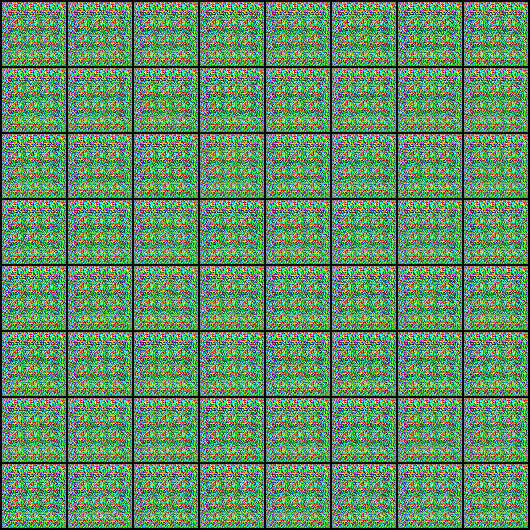

In [37]:
Image('./generated/generated-images-0001.png')

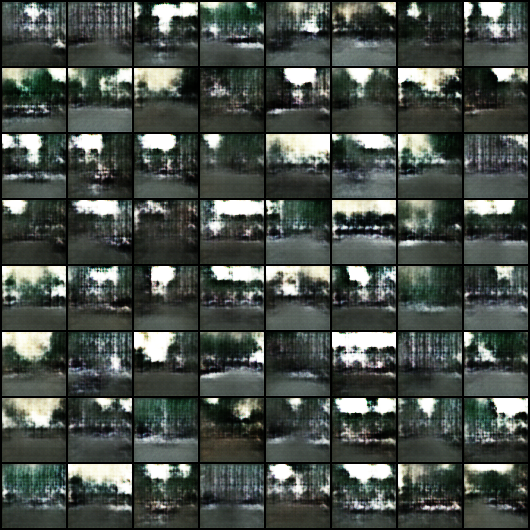

In [38]:
Image('./generated/generated-images-0050.png')

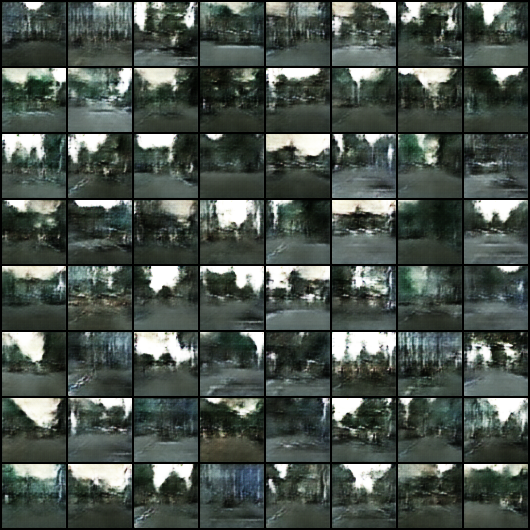

In [39]:
Image('./generated/generated-images-0100.png')

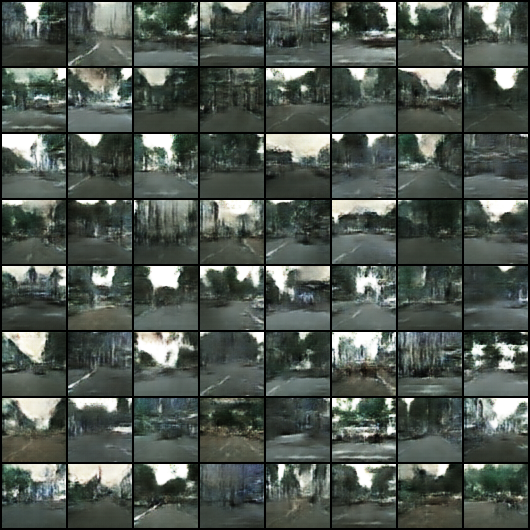

In [50]:
Image('./generated/generated-images-0150.png')

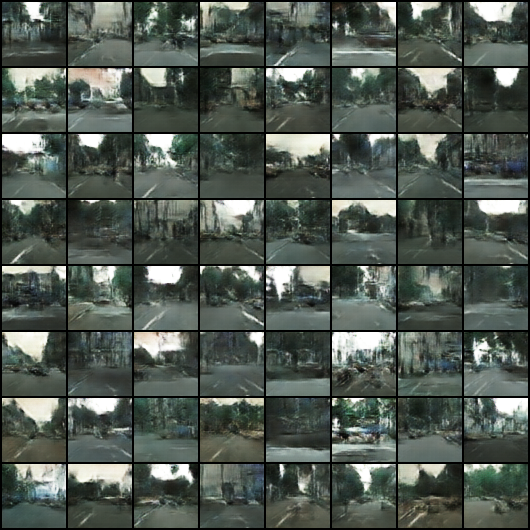

In [40]:
Image('./generated/generated-images-0200.png')

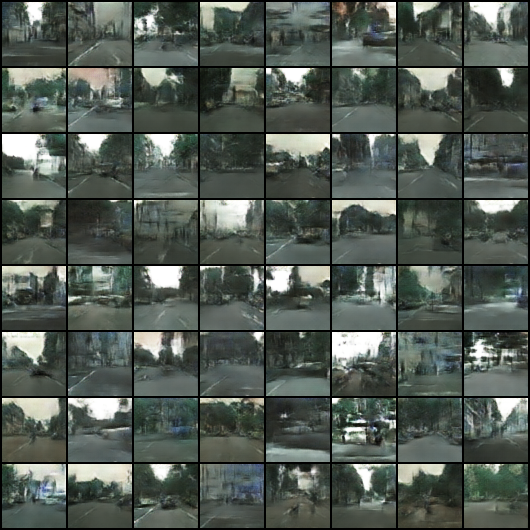

In [49]:
Image('./generated/generated-images-0250.png')

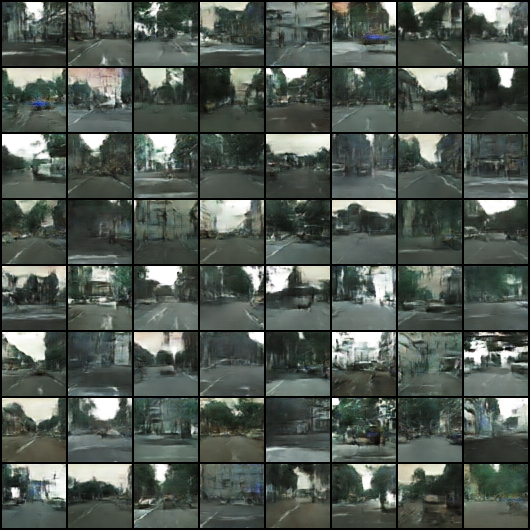

In [41]:
Image('./generated/generated-images-0300.png')

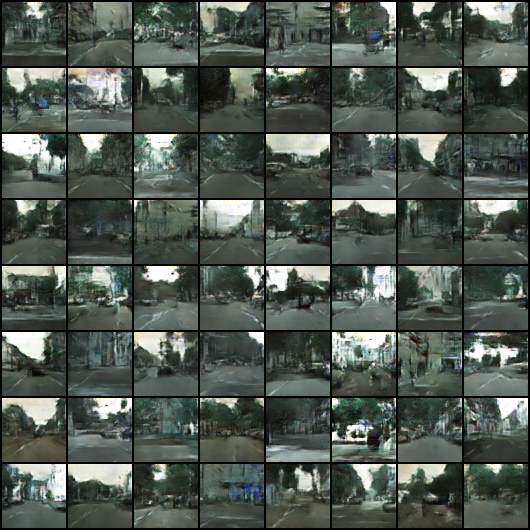

In [48]:
Image('./generated/generated-images-0350.png')

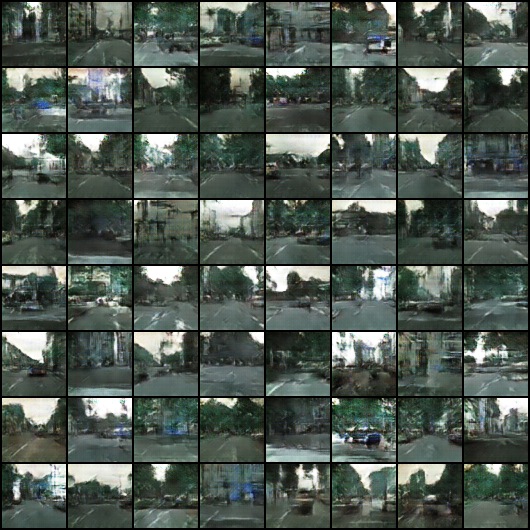

In [42]:
Image('./generated/generated-images-0400.png')

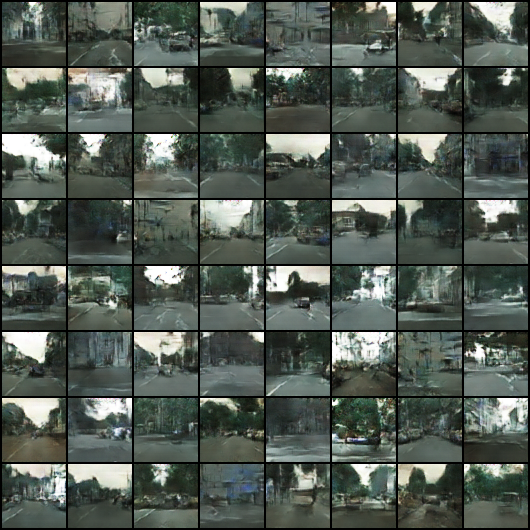

In [47]:
Image('./generated/generated-images-0450.png')

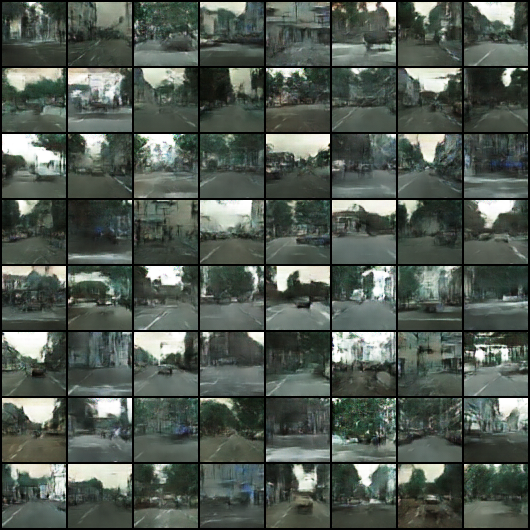

In [43]:
Image('./generated/generated-images-0500.png')

In [44]:
import cv2
import os

vid_fname = 'gans_training.avi'

files = [os.path.join(sample_dir, f) for f in os.listdir(sample_dir) if 'generated' in f]
files.sort()

out = cv2.VideoWriter(vid_fname,cv2.VideoWriter_fourcc(*'MP4V'), 1, (530,530))
[out.write(cv2.imread(fname)) for fname in files]
out.release()

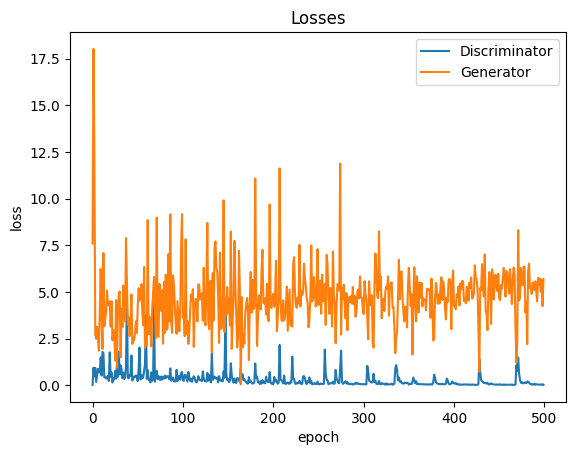

In [45]:
plt.plot(losses_d, '-')
plt.plot(losses_g, '-')
plt.xlabel('epoch')
plt.ylabel('loss')
plt.legend(['Discriminator', 'Generator'])
plt.title('Losses');

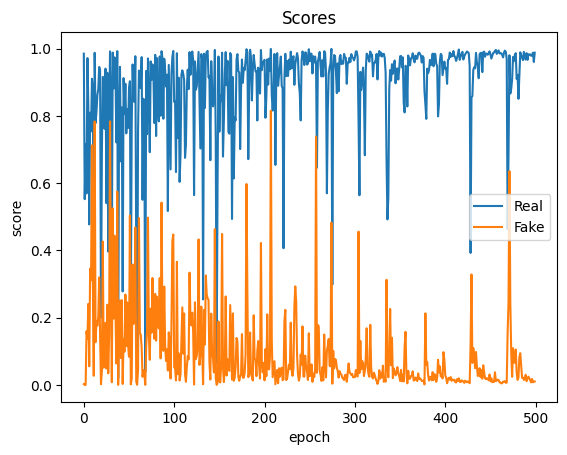

In [46]:
plt.plot(real_scores, '-')
plt.plot(fake_scores, '-')
plt.xlabel('epoch')
plt.ylabel('score')
plt.legend(['Real', 'Fake'])
plt.title('Scores');